<a href="https://colab.research.google.com/github/stanislavfort/adversaries_to_convnext/blob/main/adversaries_to_ConvNeXt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Easy to find adversaries to the new ConvNeXt architecture

The new ConvNeXt architecture from Meta (Facebook) AI Research just came out and I wanted to see if it has adversarial examples. It turns out that it does and that **they are easy to find**. In this notebook I
- load the ConvNeXt architecture
- download an image and preprocess it
- find an adversarial example to it

The expected output of this Colab is the following:
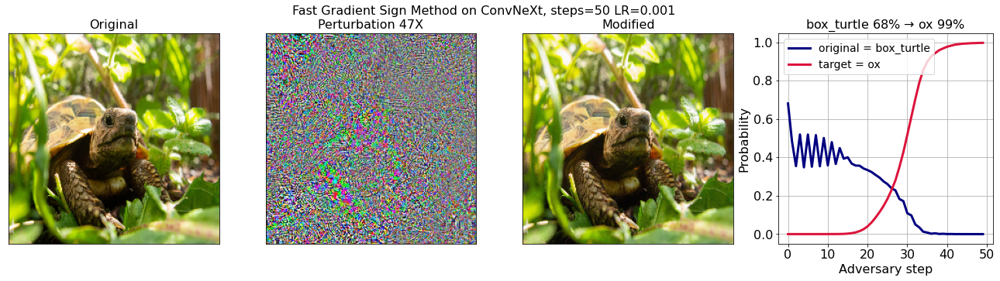

For a quick start, I am using the [https://github.com/leondgarse/keras_cv_attention_models](https://github.com/leondgarse/keras_cv_attention_models) repository which has been a great starter code

# Installing packages and repo

In [1]:
import os
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras

In [2]:
pip install -U git+https://github.com/leondgarse/keras_cv_attention_models

  Cloning https://github.com/leondgarse/keras_cv_attention_models to /tmp/pip-req-build-zjiexrb3
  Running command git clone -q https://github.com/leondgarse/keras_cv_attention_models /tmp/pip-req-build-zjiexrb3
     |████████████████████████████████| 1.1 MB 13.3 MB/s 
  Created wheel for keras-cv-attention-models: filename=keras_cv_attention_models-1.1.18-py3-none-any.whl size=1610647 sha256=6aa68f9abfdeef936bffdafff03614f4e961f1e2f0941f7adacf375074b32ba0
  Stored in directory: /tmp/pip-ephem-wheel-cache-e51ztg_7/wheels/ec/82/43/aad81de1334b3cae80dccfeed593aa782a17e226c403202b8c
Successfully built keras-cv-attention-models


# Getting the inverse of the image preprocessing

In [3]:
per_channel_max = keras.applications.imagenet_utils.preprocess_input(255*np.ones((1,1,1,3)), mode='torch')[0,0,0]
per_channel_min = keras.applications.imagenet_utils.preprocess_input(0*np.ones((1,1,1,3)), mode='torch')[0,0,0]

def deprocess_image(image):
  return (image - per_channel_min.reshape([1,1,1,3]))/((per_channel_max-per_channel_min).reshape([1,1,1,3]))*255


# Image downloading

In [4]:
import requests
import PIL
import io
import matplotlib.pyplot as plt

def download_image(url):
    resp = requests.get(url)
    resp.raise_for_status()
    return PIL.Image.open(io.BytesIO(resp.content))

# An adversary-finding loop

We are using the Fast Gradient Sign Method which is an easy to use baseline for finding adversarial examples

## Get the ConvNeXt pretrained model

In [5]:
from keras_cv_attention_models import convnext

mm = convnext.ConvNeXtBase()

355229696/355218688 [==============================] - 19s 0us/step
>>>> Load pretrained from: /root/.keras/models/convnext_base_imagenet.h5


## Get the image

In [6]:
downloaded_image = download_image(
    "https://www.popsci.com/uploads/2021/09/21/Tortoise-on-ground-surrounded-by-plants.jpg?auto=webp"
    )

downloaded_image_np = np.array(downloaded_image)

## Initial prediction

In [7]:
img = downloaded_image_np
imm = keras.applications.imagenet_utils.preprocess_input(img, mode='torch')
image_input = tf.expand_dims(tf.image.resize(imm, mm.input_shape[1:3]), 0)

pred = mm(image_input)
pred_np = pred.numpy()

## Show initial picture and predictions

49152/35363 [=========================================] - 0s 0us/step


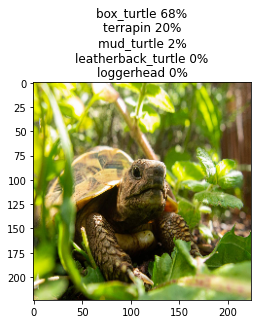

In [8]:
pred_names = keras.applications.imagenet_utils.decode_predictions(pred.numpy())[0]

title = ""
for i in range(5):
  title = title + pred_names[i][1]+" "+str(int(100*pred_names[i][2]))+"%\n"

title = title[:-1] #removing the last line break

plt.title(title)
plt.imshow(
    deprocess_image(image_input.numpy())[0].astype(np.uint8)
    )
plt.show()

## Adverary loop

In [9]:
def get_class_name(c):
  artificial_preds = np.zeros((1,1000))
  artificial_preds[0,c] = 1.0
  return keras.applications.imagenet_utils.decode_predictions(artificial_preds)[0][0][1]

In [10]:
steps = 50
use_gradient_signs_only = True #True = Fast Gradient Sign Method
LR = 1e-3

show_image_every = 5

target_class = 345
print("target class name = "+str(get_class_name(target_class)))

target class name = ox


In [11]:
def rescale_image(im):
  return (im - np.min(im))/(np.max(im) - np.min(im))*255

0 8.415965e-05
[('n01669191', 'box_turtle', 0.68062854), ('n01667778', 'terrapin', 0.20469324), ('n01667114', 'mud_turtle', 0.02825296), ('n01665541', 'leatherback_turtle', 0.0004310583), ('n01664065', 'loggerhead', 0.0003222988)]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


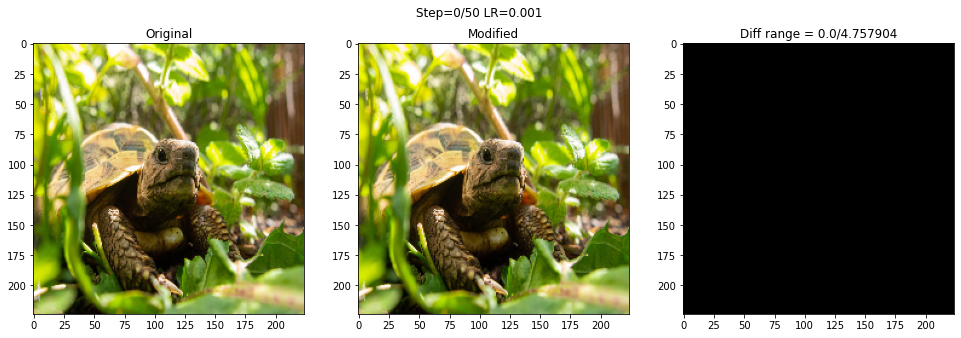

1 9.776009e-05
[('n01669191', 'box_turtle', 0.4832226), ('n01667778', 'terrapin', 0.38394445), ('n01667114', 'mud_turtle', 0.034011018), ('n01665541', 'leatherback_turtle', 0.00059037784), ('n01664065', 'loggerhead', 0.00039252458)]
2 0.00010623299
[('n01667778', 'terrapin', 0.5102013), ('n01669191', 'box_turtle', 0.35444263), ('n01667114', 'mud_turtle', 0.03247944), ('n01665541', 'leatherback_turtle', 0.00065154245), ('n01664065', 'loggerhead', 0.0003967656)]
3 0.00011555507
[('n01669191', 'box_turtle', 0.5193526), ('n01667778', 'terrapin', 0.3482475), ('n01667114', 'mud_turtle', 0.028250314), ('n01665541', 'leatherback_turtle', 0.00054879475), ('n01664065', 'loggerhead', 0.00035997617)]
4 0.00012636001
[('n01667778', 'terrapin', 0.5153812), ('n01669191', 'box_turtle', 0.34786376), ('n01667114', 'mud_turtle', 0.02771245), ('n01665541', 'leatherback_turtle', 0.00063639204), ('n01664065', 'loggerhead', 0.00037507547)]
5 0.00013891238
[('n01669191', 'box_turtle', 0.51901436), ('n01667778

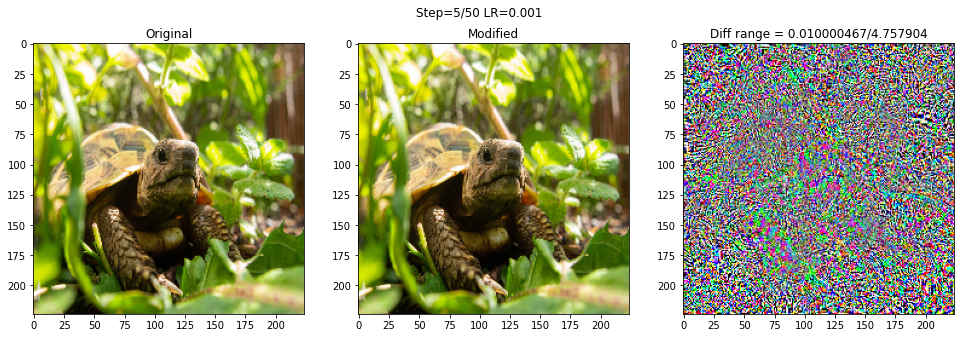

6 0.00015443184
[('n01667778', 'terrapin', 0.50958335), ('n01669191', 'box_turtle', 0.35105547), ('n01667114', 'mud_turtle', 0.02320791), ('n01665541', 'leatherback_turtle', 0.00061516656), ('n02457408', 'three-toed_sloth', 0.00040162395)]
7 0.00017312844
[('n01669191', 'box_turtle', 0.51594216), ('n01667778', 'terrapin', 0.34554055), ('n01667114', 'mud_turtle', 0.020184133), ('n01665541', 'leatherback_turtle', 0.00052081357), ('n02457408', 'three-toed_sloth', 0.0004672935)]
8 0.00019876879
[('n01667778', 'terrapin', 0.5020494), ('n01669191', 'box_turtle', 0.35352838), ('n01667114', 'mud_turtle', 0.019244181), ('n01665541', 'leatherback_turtle', 0.0005932751), ('n02457408', 'three-toed_sloth', 0.0005569954)]
9 0.00023417512
[('n01669191', 'box_turtle', 0.5008702), ('n01667778', 'terrapin', 0.35277766), ('n01667114', 'mud_turtle', 0.01693288), ('n02457408', 'three-toed_sloth', 0.00064450945), ('n01665541', 'leatherback_turtle', 0.0005155315)]
10 0.00028217092
[('n01667778', 'terrapin', 

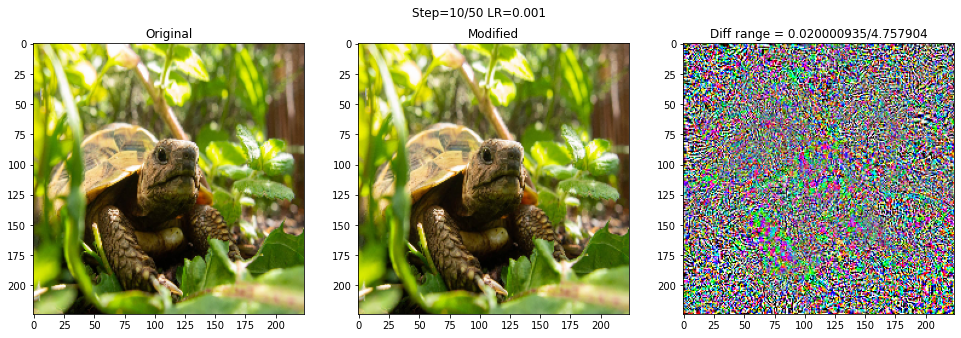

11 0.00034738213
[('n01669191', 'box_turtle', 0.47921276), ('n01667778', 'terrapin', 0.36171326), ('n01667114', 'mud_turtle', 0.013855541), ('n02457408', 'three-toed_sloth', 0.0008675282), ('n02105056', 'groenendael', 0.000781061)]
12 0.0004427732
[('n01667778', 'terrapin', 0.46431252), ('n01669191', 'box_turtle', 0.365626), ('n01667114', 'mud_turtle', 0.012476408), ('n02105056', 'groenendael', 0.0010996672), ('n02111277', 'Newfoundland', 0.0010537994)]
13 0.00065469416
[('n01669191', 'box_turtle', 0.44822717), ('n01667778', 'terrapin', 0.36751908), ('n01667114', 'mud_turtle', 0.011016401), ('n02111277', 'Newfoundland', 0.0015050779), ('n02105056', 'groenendael', 0.0014827879)]
14 0.0012391948
[('n01667778', 'terrapin', 0.40174332), ('n01669191', 'box_turtle', 0.39297888), ('n01667114', 'mud_turtle', 0.0098576285), ('n02111277', 'Newfoundland', 0.0019478872), ('n02105056', 'groenendael', 0.0018568991)]
15 0.0025758983
[('n01669191', 'box_turtle', 0.4003152), ('n01667778', 'terrapin', 0

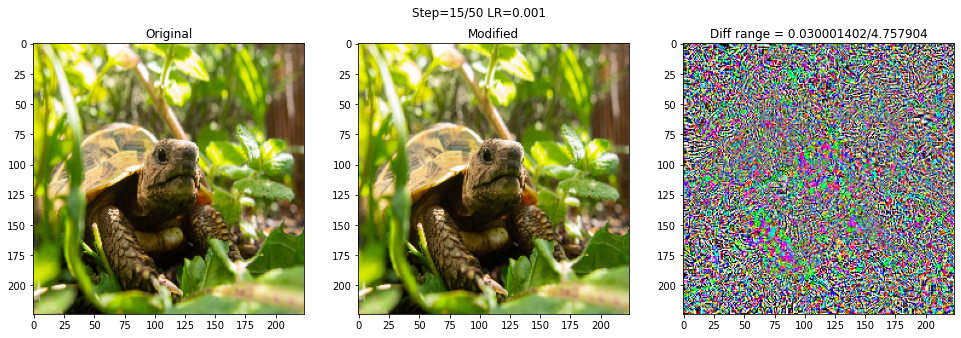

16 0.0049715172
[('n01667778', 'terrapin', 0.38917753), ('n01669191', 'box_turtle', 0.36753464), ('n01667114', 'mud_turtle', 0.008205414), ('n02403003', 'ox', 0.0049715172), ('n02410509', 'bison', 0.0036709795)]
17 0.009034266
[('n01667778', 'terrapin', 0.38077143), ('n01669191', 'box_turtle', 0.3573665), ('n02403003', 'ox', 0.009034266), ('n01667114', 'mud_turtle', 0.007648773), ('n02410509', 'bison', 0.0058574486)]
18 0.015634423
[('n01667778', 'terrapin', 0.36069632), ('n01669191', 'box_turtle', 0.35639212), ('n02403003', 'ox', 0.015634423), ('n02410509', 'bison', 0.008425312), ('n01667114', 'mud_turtle', 0.007139216)]
19 0.025761666
[('n01667778', 'terrapin', 0.35411566), ('n01669191', 'box_turtle', 0.3418389), ('n02403003', 'ox', 0.025761666), ('n03868242', 'oxcart', 0.011138472), ('n02410509', 'bison', 0.010725191)]
20 0.040541694
[('n01667778', 'terrapin', 0.34124476), ('n01669191', 'box_turtle', 0.33370274), ('n02403003', 'ox', 0.040541694), ('n03868242', 'oxcart', 0.017766843)

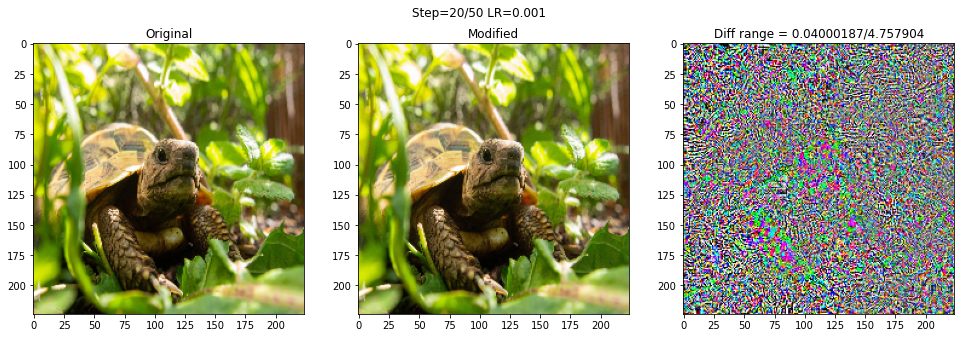

21 0.060797956
[('n01667778', 'terrapin', 0.32821274), ('n01669191', 'box_turtle', 0.32368082), ('n02403003', 'ox', 0.060797956), ('n03868242', 'oxcart', 0.028936759), ('n02410509', 'bison', 0.011070943)]
22 0.08599462
[('n01667778', 'terrapin', 0.31988457), ('n01669191', 'box_turtle', 0.30857876), ('n02403003', 'ox', 0.08599462), ('n03868242', 'oxcart', 0.04462957), ('n02410509', 'bison', 0.009822749)]
23 0.114504434
[('n01667778', 'terrapin', 0.30507925), ('n01669191', 'box_turtle', 0.29460758), ('n02403003', 'ox', 0.114504434), ('n03868242', 'oxcart', 0.061624583), ('n02408429', 'water_buffalo', 0.009679562)]
24 0.1462689
[('n01667778', 'terrapin', 0.2946404), ('n01669191', 'box_turtle', 0.27505246), ('n02403003', 'ox', 0.1462689), ('n03868242', 'oxcart', 0.073556006), ('n02408429', 'water_buffalo', 0.009900071)]
25 0.183681
[('n01667778', 'terrapin', 0.27524248), ('n01669191', 'box_turtle', 0.26063472), ('n02403003', 'ox', 0.183681), ('n03868242', 'oxcart', 0.0756657), ('n02408429'

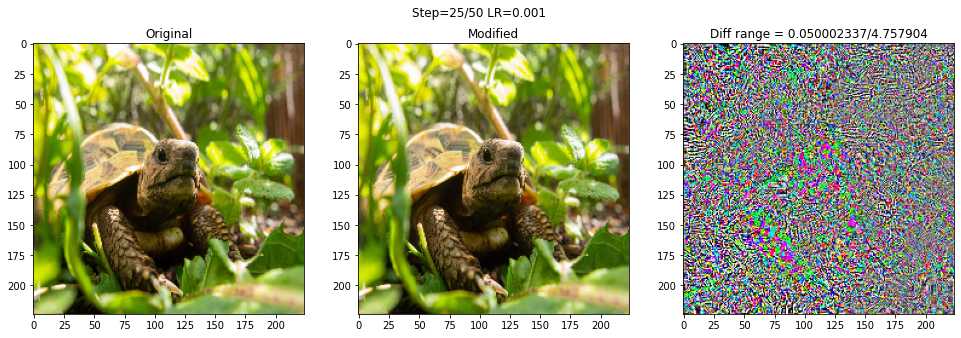

26 0.22867209
[('n01667778', 'terrapin', 0.25614405), ('n01669191', 'box_turtle', 0.23922987), ('n02403003', 'ox', 0.22867209), ('n03868242', 'oxcart', 0.074353494), ('n02408429', 'water_buffalo', 0.0112065775)]
27 0.28016627
[('n02403003', 'ox', 0.28016627), ('n01667778', 'terrapin', 0.23171477), ('n01669191', 'box_turtle', 0.22812213), ('n03868242', 'oxcart', 0.06892493), ('n02408429', 'water_buffalo', 0.010111598)]
28 0.34948206
[('n02403003', 'ox', 0.34948206), ('n01667778', 'terrapin', 0.21877809), ('n01669191', 'box_turtle', 0.18321095), ('n03868242', 'oxcart', 0.06190707), ('n02408429', 'water_buffalo', 0.011504764)]
29 0.4277032
[('n02403003', 'ox', 0.4277032), ('n01667778', 'terrapin', 0.1783997), ('n01669191', 'box_turtle', 0.17182304), ('n03868242', 'oxcart', 0.053790443), ('n02408429', 'water_buffalo', 0.010253234)]
30 0.518273
[('n02403003', 'ox', 0.518273), ('n01667778', 'terrapin', 0.1727159), ('n01669191', 'box_turtle', 0.108506605), ('n03868242', 'oxcart', 0.03804311),

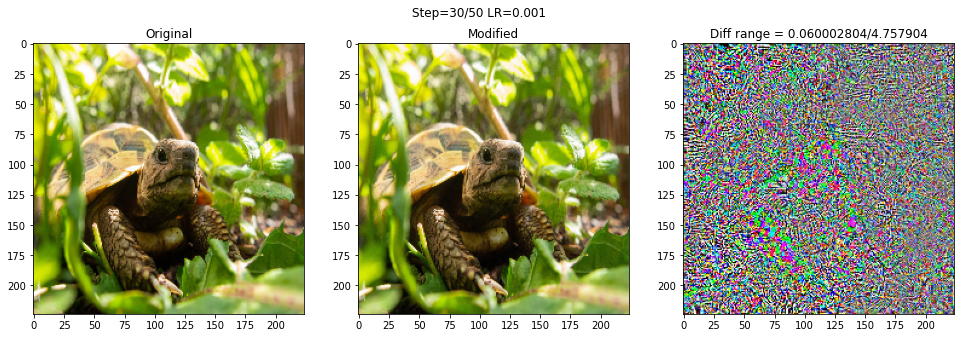

31 0.61066663
[('n02403003', 'ox', 0.61066663), ('n01667778', 'terrapin', 0.11884431), ('n01669191', 'box_turtle', 0.09771491), ('n03868242', 'oxcart', 0.033663273), ('n02408429', 'water_buffalo', 0.012100445)]
32 0.703535
[('n02403003', 'ox', 0.703535), ('n01667778', 'terrapin', 0.09460149), ('n01669191', 'box_turtle', 0.050415862), ('n03868242', 'oxcart', 0.021272052), ('n02408429', 'water_buffalo', 0.017621063)]
33 0.7893541
[('n02403003', 'ox', 0.7893541), ('n01667778', 'terrapin', 0.05006109), ('n01669191', 'box_turtle', 0.03510948), ('n02408429', 'water_buffalo', 0.01879225), ('n03868242', 'oxcart', 0.017675163)]
34 0.855019
[('n02403003', 'ox', 0.855019), ('n02408429', 'water_buffalo', 0.027600007), ('n01667778', 'terrapin', 0.024914289), ('n01669191', 'box_turtle', 0.012495761), ('n03868242', 'oxcart', 0.010407196)]
35 0.89806587
[('n02403003', 'ox', 0.89806587), ('n02408429', 'water_buffalo', 0.021201532), ('n01667778', 'terrapin', 0.010800826), ('n03868242', 'oxcart', 0.00858

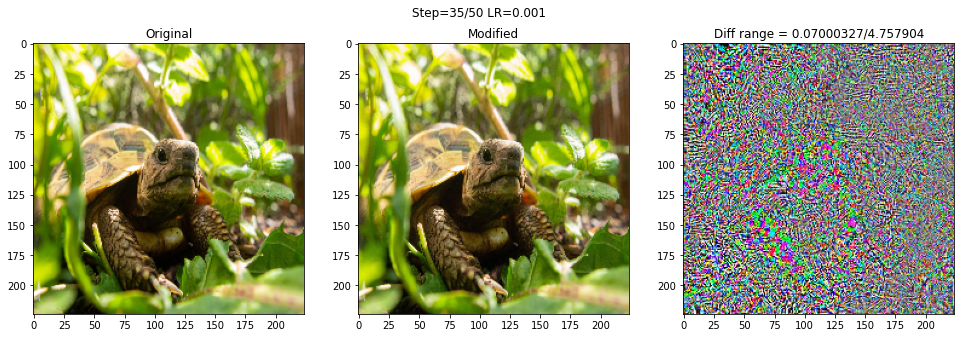

36 0.92631716
[('n02403003', 'ox', 0.92631716), ('n02408429', 'water_buffalo', 0.022054132), ('n03868242', 'oxcart', 0.005044918), ('n02457408', 'three-toed_sloth', 0.0039281696), ('n01667778', 'terrapin', 0.003833227)]
37 0.9430404
[('n02403003', 'ox', 0.9430404), ('n02408429', 'water_buffalo', 0.008867534), ('n01667778', 'terrapin', 0.0051932624), ('n03868242', 'oxcart', 0.004889688), ('n01669191', 'box_turtle', 0.0042398362)]
38 0.9583545
[('n02403003', 'ox', 0.9583545), ('n02408429', 'water_buffalo', 0.011292811), ('n03868242', 'oxcart', 0.002372494), ('n02457408', 'three-toed_sloth', 0.0017875413), ('n02437616', 'llama', 0.0014663604)]
39 0.9675635
[('n02403003', 'ox', 0.9675635), ('n02408429', 'water_buffalo', 0.004400277), ('n01667778', 'terrapin', 0.002318795), ('n03868242', 'oxcart', 0.0023161904), ('n01669191', 'box_turtle', 0.0018362948)]
40 0.97648925
[('n02403003', 'ox', 0.97648925), ('n02408429', 'water_buffalo', 0.005055826), ('n02437616', 'llama', 0.0010789295), ('n0386

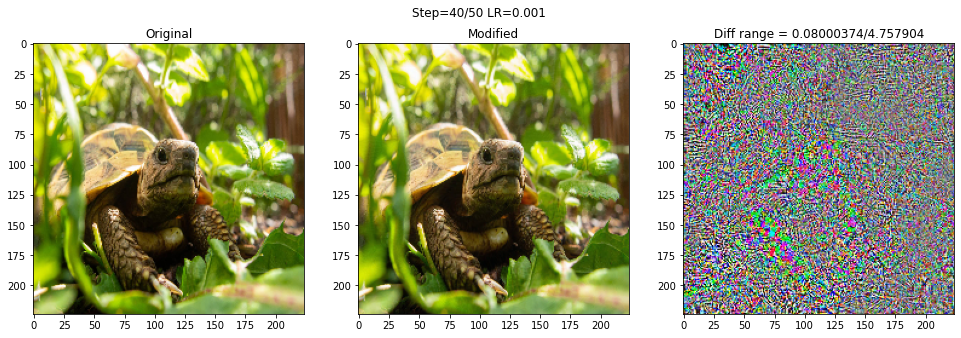

41 0.9819754
[('n02403003', 'ox', 0.9819754), ('n02408429', 'water_buffalo', 0.0019850573), ('n03868242', 'oxcart', 0.0010246903), ('n01667778', 'terrapin', 0.0008735223), ('n01669191', 'box_turtle', 0.0006747579)]
42 0.9871596
[('n02403003', 'ox', 0.9871596), ('n02408429', 'water_buffalo', 0.001886142), ('n02437616', 'llama', 0.0007237548), ('n03868242', 'oxcart', 0.00045737735), ('n02457408', 'three-toed_sloth', 0.0004154892)]
43 0.98994166
[('n02403003', 'ox', 0.98994166), ('n02408429', 'water_buffalo', 0.00077053654), ('n03868242', 'oxcart', 0.0004680463), ('n02437616', 'llama', 0.00028147447), ('n01667778', 'terrapin', 0.00027527893)]
44 0.99233764
[('n02403003', 'ox', 0.99233764), ('n02408429', 'water_buffalo', 0.0007452561), ('n02437616', 'llama', 0.0004831316), ('n02457408', 'three-toed_sloth', 0.00024233208), ('n03868242', 'oxcart', 0.00020499039)]
45 0.99332243
[('n02403003', 'ox', 0.99332243), ('n02408429', 'water_buffalo', 0.00032240228), ('n03868242', 'oxcart', 0.000269255

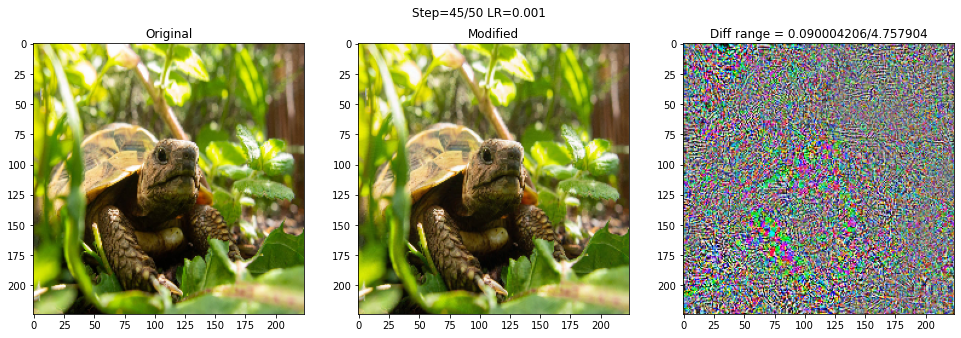

46 0.99477273
[('n02403003', 'ox', 0.99477273), ('n02408429', 'water_buffalo', 0.0003848057), ('n02437616', 'llama', 0.00034071907), ('n02457408', 'three-toed_sloth', 0.00014507894), ('n02412080', 'ram', 0.0001339701)]
47 0.9953112
[('n02403003', 'ox', 0.9953112), ('n02408429', 'water_buffalo', 0.00018311775), ('n03868242', 'oxcart', 0.00015932912), ('n02437616', 'llama', 0.00011770511), ('n02457408', 'three-toed_sloth', 9.4941e-05)]
48 0.99621695
[('n02403003', 'ox', 0.99621695), ('n02408429', 'water_buffalo', 0.00023919044), ('n02437616', 'llama', 0.00023521573), ('n02412080', 'ram', 0.0001022699), ('n02410509', 'bison', 9.650335e-05)]
49 0.99659073
[('n02403003', 'ox', 0.99659073), ('n02408429', 'water_buffalo', 0.00011821901), ('n03868242', 'oxcart', 0.00010233481), ('n02437616', 'llama', 8.288543e-05), ('n02410509', 'bison', 7.3841555e-05)]


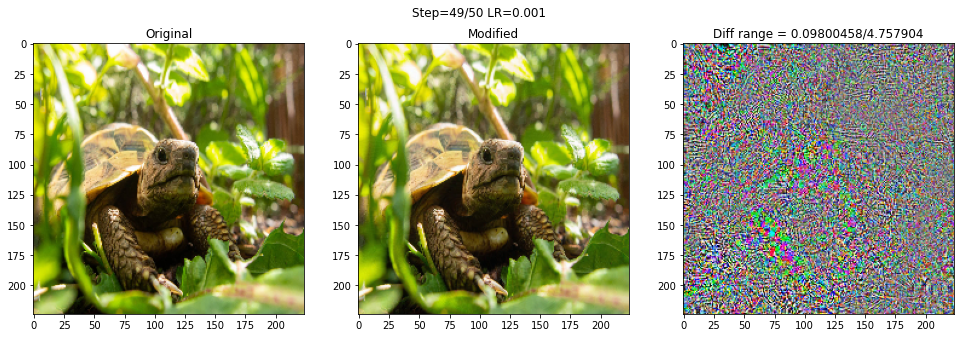

In [12]:
img = np.array(downloaded_image_np) 

imm = keras.applications.imagenet_utils.preprocess_input(img, mode='torch')
image_input = tf.expand_dims(tf.image.resize(imm, mm.input_shape[1:3]), 0)

image_input_start_np = image_input.numpy()

preds_list = []

for step in range(steps):

  with tf.GradientTape() as g:
  
    g.watch(image_input)

    pred = mm(image_input)

    if step == 0:
      original_label = np.argmax(pred.numpy()[0])

    print(step,pred.numpy()[0,target_class])
    print(keras.applications.imagenet_utils.decode_predictions(pred.numpy())[0])

    if show_image_every is not None and (step % show_image_every == 0 or step == steps-1):
      plt.figure(figsize = (3*5.5,5))

      plt.suptitle("Step="+str(step)+"/"+str(steps)+" LR="+str(LR))

      plt.subplot(1,3,1)
      plt.title("Original")
      plt.imshow(
          np.round(
              deprocess_image(image_input_start_np)[0]
          ).astype(np.uint8)
        )

      plt.subplot(1,3,2)
      plt.title("Modified")
      plt.imshow(
          np.round(
              rescale_image(deprocess_image(image_input.numpy())[0])
          ).astype(np.uint8)
        )

      img_diff = image_input.numpy() - image_input_start_np
      diff_range = np.max(img_diff) - np.min(img_diff)
      img_range = np.max(image_input_start_np) - np.min(image_input_start_np)

      plt.subplot(1,3,3)
      plt.title("Diff range = "+str(diff_range)+"/"+str(img_range))
      plt.imshow(
          ((img_diff - np.min(img_diff))/diff_range*255)[0].astype(np.uint8)
          )

      plt.show()

    preds_list.append(pred.numpy())

    selected_class_pred = pred[0,target_class]

  image_gradient = g.gradient(selected_class_pred, image_input)

  if use_gradient_signs_only:
    image_gradient = tf.cast(tf.greater(image_gradient,0),tf.float32)*2.0-1.0

  image_input = image_input + LR*image_gradient

preds_np = np.concatenate(preds_list,axis=0)


## Class predictions plot

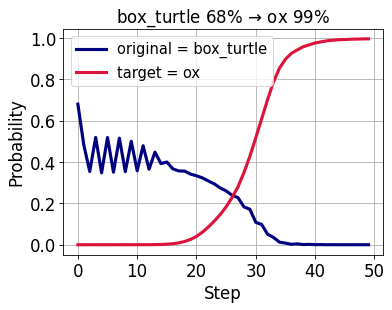

In [13]:
plt.figure(figsize = (5.5,4),dpi=75)

title = get_class_name(original_label) + " " + str(int(100*preds_np[0,original_label]))+"%"
title = title + " $\\to$"
title = title + " " + get_class_name(target_class) + " " + str(int(100*preds_np[-1,target_class]))+"%"

plt.title(title,fontsize=16)

plt.plot(preds_np[:,original_label],linewidth=3,color="navy",label="original = "+get_class_name(original_label))
plt.plot(preds_np[:,target_class],linewidth=3,color="crimson",label="target = "+get_class_name(target_class))

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=14)

plt.xlabel("Step",fontsize=16)
plt.ylabel("Probability",fontsize=16)

plt.grid(True)

plt.show()

## Nice final plot

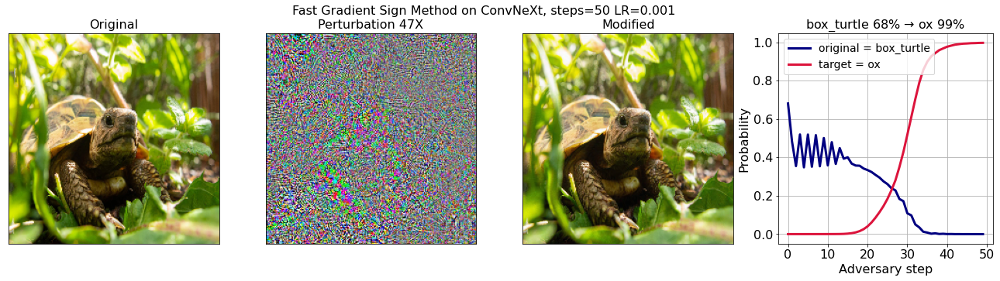

In [14]:
plt.figure(figsize = (4*5.7,5))

plt.suptitle("Fast Gradient Sign Method on ConvNeXt, steps="+str(steps)+" LR="+str(LR),fontsize=16)

plt.subplot(1,4,1)
plt.title("Original",fontsize=16)
plt.imshow(
    np.round(
        deprocess_image(image_input_start_np)[0]
    ).astype(np.uint8)
  )

plt.xticks([],[])
plt.yticks([],[])


plt.subplot(1,4,3)
plt.title("Modified",fontsize=16)
plt.imshow(
    np.round(
        rescale_image(deprocess_image(image_input.numpy())[0])
    ).astype(np.uint8)
  )

img_diff = image_input.numpy() - image_input_start_np
diff_range = np.max(img_diff) - np.min(img_diff)
img_range = np.max(image_input_start_np) - np.min(image_input_start_np)

plt.xticks([],[])
plt.yticks([],[])


plt.subplot(1,4,2)
plt.title("Perturbation "+str(int(img_range/diff_range))+"X",fontsize=16)
plt.imshow(
    ((img_diff - np.min(img_diff))/diff_range*255)[0].astype(np.uint8)
    )

plt.xticks([],[])
plt.yticks([],[])

plt.subplot(1,4,4)

title = get_class_name(original_label) + " " + str(int(100*preds_np[0,original_label]))+"%"
title = title + " $\\to$"
title = title + " " + get_class_name(target_class) + " " + str(int(100*preds_np[-1,target_class]))+"%"

plt.title(title,fontsize=16)

plt.plot(preds_np[:,original_label],linewidth=3,color="navy",label="original = "+get_class_name(original_label))
plt.plot(preds_np[:,target_class],linewidth=3,color="crimson",label="target = "+get_class_name(target_class))

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=14)

plt.xlabel("Adversary step",fontsize=16)
plt.ylabel("Probability",fontsize=16)

plt.grid(True)


plt.show()
